## Step 1: Mount Azure Blob Storage (Using SAS Token) and Testing of PySpark

In [0]:
dbutils.fs.mount(
      source="wasbs://nytaxi@nytaxidata2025.blob.core.windows.net/",
        mount_point="/mnt/nytaxi",
          extra_configs={
              "fs.azure.sas.nytaxi.nytaxidata2025.blob.core.windows.net": "sv=2024-11-04&ss=bf&srt=co&sp=rwdlaciytfx&se=2025-07-15T11:20:26Z&st=2025-07-14T03:20:26Z&spr=https&sig=gRGPtH4W7taLFA6yX9Qhu0i1ECIzeZdvXq3DdfWM068%3D"
                }
                )

True

In [0]:
print("Hello, PySpark!")

Hello, PySpark!


## Step 2: Loading and Exploring the Data

In [0]:
trip_data = spark.read.parquet("/mnt/nytaxi/yellow_tripdata_2025-01.parquet", header=True, inferSchema=True)
taxi_fare = spark.read.parquet("/mnt/nytaxi/yellow_tripdata_2025-02.parquet", header=True, inferSchema=True)

In [0]:
# Explore Schema:

trip_data.printSchema()
taxi_fare.printSchema()

root
 |-- VendorID: integer (nullable = true)
 |-- tpep_pickup_datetime: timestamp_ntz (nullable = true)
 |-- tpep_dropoff_datetime: timestamp_ntz (nullable = true)
 |-- passenger_count: long (nullable = true)
 |-- trip_distance: double (nullable = true)
 |-- RatecodeID: long (nullable = true)
 |-- store_and_fwd_flag: string (nullable = true)
 |-- PULocationID: integer (nullable = true)
 |-- DOLocationID: integer (nullable = true)
 |-- payment_type: long (nullable = true)
 |-- fare_amount: double (nullable = true)
 |-- extra: double (nullable = true)
 |-- mta_tax: double (nullable = true)
 |-- tip_amount: double (nullable = true)
 |-- tolls_amount: double (nullable = true)
 |-- improvement_surcharge: double (nullable = true)
 |-- total_amount: double (nullable = true)
 |-- congestion_surcharge: double (nullable = true)
 |-- Airport_fee: double (nullable = true)
 |-- cbd_congestion_fee: double (nullable = true)

root
 |-- VendorID: integer (nullable = true)
 |-- tpep_pickup_datetime: ti

In [0]:
# Display Few Rows:

display(trip_data)
display(taxi_fare)

VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,cbd_congestion_fee
1,2025-01-01T00:18:38,2025-01-01T00:26:59,1,1.6,1,N,229,237,1,10.0,3.5,0.5,3.0,0.0,1.0,18.0,2.5,0.0,0.0
1,2025-01-01T00:32:40,2025-01-01T00:35:13,1,0.5,1,N,236,237,1,5.1,3.5,0.5,2.02,0.0,1.0,12.12,2.5,0.0,0.0
1,2025-01-01T00:44:04,2025-01-01T00:46:01,1,0.6,1,N,141,141,1,5.1,3.5,0.5,2.0,0.0,1.0,12.1,2.5,0.0,0.0
2,2025-01-01T00:14:27,2025-01-01T00:20:01,3,0.52,1,N,244,244,2,7.2,1.0,0.5,0.0,0.0,1.0,9.7,0.0,0.0,0.0
2,2025-01-01T00:21:34,2025-01-01T00:25:06,3,0.66,1,N,244,116,2,5.8,1.0,0.5,0.0,0.0,1.0,8.3,0.0,0.0,0.0
2,2025-01-01T00:48:24,2025-01-01T01:08:26,2,2.63,1,N,239,68,2,19.1,1.0,0.5,0.0,0.0,1.0,24.1,2.5,0.0,0.0
1,2025-01-01T00:14:47,2025-01-01T00:16:15,0,0.4,1,N,170,170,1,4.4,3.5,0.5,2.35,0.0,1.0,11.75,2.5,0.0,0.0
1,2025-01-01T00:39:27,2025-01-01T00:51:51,0,1.6,1,N,234,148,1,12.1,3.5,0.5,2.0,0.0,1.0,19.1,2.5,0.0,0.0
1,2025-01-01T00:53:43,2025-01-01T01:13:23,0,2.8,1,N,148,170,1,19.1,3.5,0.5,3.0,0.0,1.0,27.1,2.5,0.0,0.0
2,2025-01-01T00:00:02,2025-01-01T00:09:36,1,1.71,1,N,237,262,2,11.4,1.0,0.5,0.0,0.0,1.0,16.4,2.5,0.0,0.0


VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,cbd_congestion_fee
2,2025-02-01T00:12:18,2025-02-01T00:32:33,3,3.12,1,N,246,79,1,19.8,1.0,0.5,5.11,0.0,1.0,30.66,2.5,0.0,0.75
2,2025-02-01T00:40:04,2025-02-01T00:49:15,1,1.4,1,N,114,79,1,10.0,1.0,0.5,3.15,0.0,1.0,18.9,2.5,0.0,0.75
1,2025-02-01T00:06:09,2025-02-01T00:11:51,0,0.4,1,N,211,144,1,6.5,4.25,0.5,1.0,0.0,1.0,13.25,2.5,0.0,0.75
1,2025-02-01T00:15:13,2025-02-01T00:20:19,0,0.7,1,N,113,249,1,7.2,4.25,0.5,2.0,0.0,1.0,14.95,2.5,0.0,0.75
2,2025-02-01T00:02:52,2025-02-01T00:20:25,1,4.19,1,N,113,263,1,19.8,1.0,0.5,5.11,0.0,1.0,30.66,2.5,0.0,0.75
2,2025-02-01T00:33:47,2025-02-01T00:41:49,1,1.57,1,N,162,236,1,10.0,1.0,0.5,3.15,0.0,1.0,18.9,2.5,0.0,0.75
2,2025-02-01T00:37:12,2025-02-01T00:39:49,1,0.3,1,N,164,186,1,4.4,1.0,0.5,3.0,0.0,1.0,13.15,2.5,0.0,0.75
2,2025-02-01T00:12:12,2025-02-01T00:23:30,1,1.41,1,N,45,249,1,11.4,1.0,0.5,3.43,0.0,1.0,20.58,2.5,0.0,0.75
2,2025-02-01T00:29:30,2025-02-01T00:44:51,1,2.72,1,N,114,186,1,16.3,1.0,0.5,2.0,0.0,1.0,24.05,2.5,0.0,0.75
1,2025-02-01T00:15:18,2025-02-01T00:26:00,1,2.2,1,N,158,48,2,12.8,4.25,0.5,0.0,0.0,1.0,18.55,2.5,0.0,0.75


In [0]:
# Check for Nulls in Trip_data

from pyspark.sql.functions import col

trip_data.select([col(c).isNull().alias(c) for c in trip_data.columns]).show()
trip_data.dropDuplicates().count()

+--------+--------------------+---------------------+---------------+-------------+----------+------------------+------------+------------+------------+-----------+-----+-------+----------+------------+---------------------+------------+--------------------+-----------+------------------+
|VendorID|tpep_pickup_datetime|tpep_dropoff_datetime|passenger_count|trip_distance|RatecodeID|store_and_fwd_flag|PULocationID|DOLocationID|payment_type|fare_amount|extra|mta_tax|tip_amount|tolls_amount|improvement_surcharge|total_amount|congestion_surcharge|Airport_fee|cbd_congestion_fee|
+--------+--------------------+---------------------+---------------+-------------+----------+------------------+------------+------------+------------+-----------+-----+-------+----------+------------+---------------------+------------+--------------------+-----------+------------------+
|   false|               false|                false|          false|        false|     false|             false|       false|    

3475226

In [0]:
# Check for Nulls in Taxi_fare

from pyspark.sql.functions import col

taxi_fare.select([col(c).isNull().alias(c) for c in taxi_fare.columns]).show()
taxi_fare.dropDuplicates().count()

+--------+--------------------+---------------------+---------------+-------------+----------+------------------+------------+------------+------------+-----------+-----+-------+----------+------------+---------------------+------------+--------------------+-----------+------------------+
|VendorID|tpep_pickup_datetime|tpep_dropoff_datetime|passenger_count|trip_distance|RatecodeID|store_and_fwd_flag|PULocationID|DOLocationID|payment_type|fare_amount|extra|mta_tax|tip_amount|tolls_amount|improvement_surcharge|total_amount|congestion_surcharge|Airport_fee|cbd_congestion_fee|
+--------+--------------------+---------------------+---------------+-------------+----------+------------------+------------+------------+------------+-----------+-----+-------+----------+------------+---------------------+------------+--------------------+-----------+------------------+
|   false|               false|                false|          false|        false|     false|             false|       false|    

3577543

## Step 3: Data Cleaning & Transformation

**Drop nulls in critical columns:**

In [0]:
clean_taxi_fare = taxi_fare.dropna(subset=["tpep_pickup_datetime", "tpep_dropoff_datetime", "trip_distance"])

In [0]:
clean_trip_data = trip_data.dropna(subset=["tpep_pickup_datetime", "tpep_dropoff_datetime", "trip_distance"])

**Convert to Timestamps:**

In [0]:
from pyspark.sql.functions import to_timestamp

clean_trip_data = clean_trip_data.withColumn("tpep_pickup_datetime", to_timestamp("tpep_pickup_datetime")) \
                       .withColumn("tpep_dropoff_datetime", to_timestamp("tpep_dropoff_datetime"))

In [0]:
from pyspark.sql.functions import to_timestamp

clean_taxi_fare = clean_taxi_fare.withColumn("tpep_pickup_datetime", to_timestamp("tpep_pickup_datetime")) \
                       .withColumn("tpep_dropoff_datetime", to_timestamp("tpep_dropoff_datetime"))

**Filter invalid trips:**

In [0]:
clean_trip_data = clean_trip_data.filter(col("trip_distance") > 0)

In [0]:
clean_taxi_fare = clean_taxi_fare.filter(col("trip_distance") > 0)

**Add trip duration:**

In [0]:
from pyspark.sql.functions import (col, unix_timestamp)

clean_trip_data = clean_trip_data.withColumn(
    "trip_duration",
        (unix_timestamp("tpep_dropoff_datetime") - unix_timestamp("tpep_pickup_datetime")) / 60
        )

In [0]:
from pyspark.sql.functions import (col, unix_timestamp)

clean_taxi_fare = clean_taxi_fare.withColumn(
    "trip_duration",
        (unix_timestamp("tpep_dropoff_datetime") - unix_timestamp("tpep_pickup_datetime")) / 60
        )

**Format datetime columns to remove milliseconds**

In [0]:
from pyspark.sql.functions import date_format

clean_trip_data = clean_trip_data.withColumn("pickup_time_rounded", date_format("tpep_pickup_datetime", "yyyy-MM-dd HH:mm:ss"))
clean_taxi_fare = clean_taxi_fare.withColumn("pickup_time_rounded", date_format("tpep_pickup_datetime", "yyyy-MM-dd HH:mm:ss"))

##  Step 4: Joining Datasets

In [0]:
# Join the two cleaned datasets
full_data = clean_trip_data.unionByName(clean_taxi_fare)

# Verify combined row count
print("Combined row count:", full_data.count())

# Show sample
full_data.show(5)

Combined row count: 6862105
+--------+--------------------+---------------------+---------------+-------------+----------+------------------+------------+------------+------------+-----------+-----+-------+----------+------------+---------------------+------------+--------------------+-----------+------------------+-----------------+-------------------+
|VendorID|tpep_pickup_datetime|tpep_dropoff_datetime|passenger_count|trip_distance|RatecodeID|store_and_fwd_flag|PULocationID|DOLocationID|payment_type|fare_amount|extra|mta_tax|tip_amount|tolls_amount|improvement_surcharge|total_amount|congestion_surcharge|Airport_fee|cbd_congestion_fee|    trip_duration|pickup_time_rounded|
+--------+--------------------+---------------------+---------------+-------------+----------+------------------+------------+------------+------------+-----------+-----+-------+----------+------------+---------------------+------------+--------------------+-----------+------------------+-----------------+---------

## Step 5: Analyzing the Data

**Combine and prepare the data**

In [0]:
from pyspark.sql.functions import unix_timestamp, hour

# Combine datasets
full_data = clean_trip_data.unionByName(clean_taxi_fare)

# Calculate trip_duration (in minutes)
full_data = full_data.withColumn(
    "trip_duration",
        (unix_timestamp("tpep_dropoff_datetime") - unix_timestamp("tpep_pickup_datetime")) / 60
        )

        # Extract pickup hour
full_data = full_data.withColumn("pickup_hour", hour("tpep_pickup_datetime"))

**Calculate average trip duration and fare**

In [0]:
full_data.selectExpr("avg(trip_duration) as avg_duration", "avg(fare_amount) as avg_fare").show()

+------------------+-----------------+
|      avg_duration|         avg_fare|
+------------------+-----------------+
|15.294679339162931|16.90316604453008|
+------------------+-----------------+



**Group by payment_type**

In [0]:
payment_counts = full_data.groupBy("payment_type").count()
payment_counts.show()

+------------+-------+
|payment_type|  count|
+------------+-------+
|           0|1231870|
|           1|4741858|
|           3|  36433|
|           2| 712775|
|           4| 139169|
+------------+-------+



**Trips per pickup hour**

In [0]:
hourly_trips = full_data.groupBy("pickup_hour").count().orderBy("pickup_hour")
hourly_trips.show()

+-----------+------+
|pickup_hour| count|
+-----------+------+
|          0|198087|
|          1|132763|
|          2| 90000|
|          3| 58205|
|          4| 41707|
|          5| 45863|
|          6| 99824|
|          7|201094|
|          8|278541|
|          9|284694|
|         10|293096|
|         11|313274|
|         12|344111|
|         13|362853|
|         14|391104|
|         15|414622|
|         16|411159|
|         17|468610|
|         18|496406|
|         19|430077|
+-----------+------+
only showing top 20 rows


**Top 5 pickup and dropoff locations**

In [0]:
top_pickups = full_data.groupBy("PULocationID").count().orderBy("count", ascending=False)
top_dropoffs = full_data.groupBy("DOLocationID").count().orderBy("count", ascending=False)

top_pickups.show(5)
top_dropoffs.show(5)

+------------+------+
|PULocationID| count|
+------------+------+
|         161|324836|
|         237|316678|
|         236|298858|
|         132|265494|
|         230|236116|
+------------+------+
only showing top 5 rows
+------------+------+
|DOLocationID| count|
+------------+------+
|         236|310090|
|         237|288022|
|         161|250809|
|         230|205011|
|         170|197857|
+------------+------+
only showing top 5 rows


## Step 6: Visualizing the Results

**Export aggregated results to Pandas**

In [0]:
payment_df = payment_counts.toPandas()
hourly_df = hourly_trips.toPandas()

# Sample for scatterplot
scatter_df = full_data.select("trip_distance", "fare_amount").sample(False, 0.01).toPandas()

**Create Visualizations with Matplotlib / Seaborn**

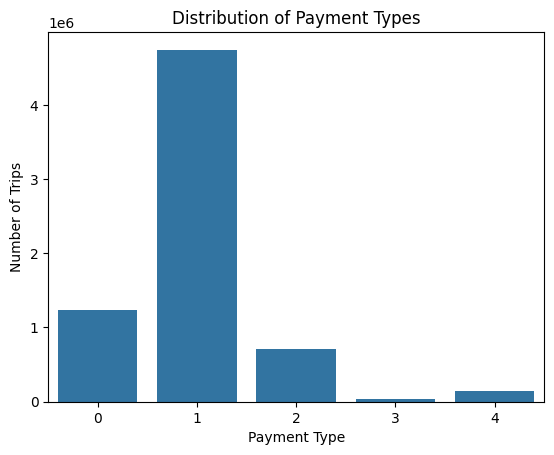

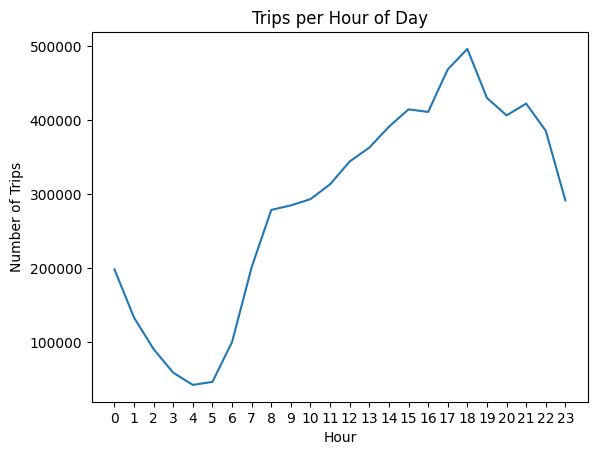

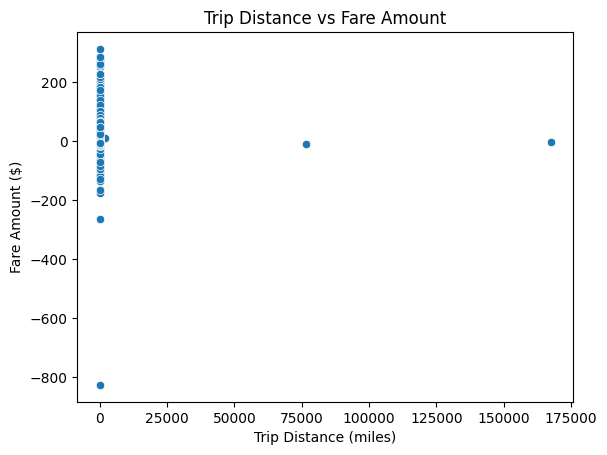

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns

# Payment Type Distribution
sns.barplot(x='payment_type', y='count', data=payment_df)
plt.title("Distribution of Payment Types")
plt.xlabel("Payment Type")
plt.ylabel("Number of Trips")
plt.show()

# Trips per Hour
sns.lineplot(x='pickup_hour', y='count', data=hourly_df)
plt.title("Trips per Hour of Day")
plt.xlabel("Hour")
plt.ylabel("Number of Trips")
plt.xticks(range(0, 24))
plt.show()

# Fare vs Distance Scatter Plot
sns.scatterplot(x="trip_distance", y="fare_amount", data=scatter_df)
plt.title("Trip Distance vs Fare Amount")
plt.xlabel("Trip Distance (miles)")
plt.ylabel("Fare Amount ($)")
plt.show()

## Step 7: Saving the Results

**Set Spark config with your SAS token**

In [0]:
spark.conf.set(
    "fs.azure.sas.nytaxi.nytaxidata2025.blob.core.windows.net",
    "sv=2024-11-04&ss=bf&srt=co&sp=rwdlaciytfx&se=2025-07-15T11:20:26Z&st=2025-07-14T03:20:26Z&spr=https&sig=gRGPtH4W7taLFA6yX9Qhu0i1ECIzeZdvXq3DdfWM068%3D"
)

**Save your DataFrame to Blob Storage**

In [0]:
full_data.write.mode("overwrite").parquet(
    "wasbs://nytaxi@nytaxidata2025.blob.core.windows.net/cleaned_data/"
)

**Check If It Saved**

In [0]:
display(dbutils.fs.ls("wasbs://nytaxi@nytaxidata2025.blob.core.windows.net/cleaned_data/"))

path,name,size,modificationTime
wasbs://nytaxi@nytaxidata2025.blob.core.windows.net/cleaned_data/_SUCCESS,_SUCCESS,0,1752511634000
wasbs://nytaxi@nytaxidata2025.blob.core.windows.net/cleaned_data/_committed_1457806662744166679,_committed_1457806662744166679,222,1752511634000
wasbs://nytaxi@nytaxidata2025.blob.core.windows.net/cleaned_data/_started_1457806662744166679,_started_1457806662744166679,0,1752511630000
wasbs://nytaxi@nytaxidata2025.blob.core.windows.net/cleaned_data/part-00000-tid-1457806662744166679-ae3cd08d-0be0-4a73-a8f0-ff4e532226fb-50-1.c000.snappy.parquet,part-00000-tid-1457806662744166679-ae3cd08d-0be0-4a73-a8f0-ff4e532226fb-50-1.c000.snappy.parquet,97200440,1752511634000
wasbs://nytaxi@nytaxidata2025.blob.core.windows.net/cleaned_data/part-00001-tid-1457806662744166679-ae3cd08d-0be0-4a73-a8f0-ff4e532226fb-51-1.c000.snappy.parquet,part-00001-tid-1457806662744166679-ae3cd08d-0be0-4a73-a8f0-ff4e532226fb-51-1.c000.snappy.parquet,98843000,1752511634000


**Save analysis results as CSV**

In [0]:
# Save as CSVs
payment_df.to_csv("/dbfs/mnt/nytaxi/payment_types.csv", index=False)
hourly_df.to_csv("/dbfs/mnt/nytaxi/peak_hours.csv", index=False)

**Write summary report in Markdown**

In [0]:
markdown_content = """
# NYC Taxi Data Analysis Summary (Jan–Feb 2025)

## Key Insights:
- **Average Trip Duration:** {:.2f} minutes
- **Average Fare:** ${:.2f}
- **Most Popular Payment Type:** {}
- **Peak Taxi Hours:** {}:00 - {}:00
- **Top Pickup Location:** PULocationID {}
- **Top Dropoff Location:** DOLocationID {}

## Notes:
Data analyzed from January and February 2025 using PySpark on Azure Databricks. Visualizations created with Seaborn and Matplotlib.
""".format(
    full_data.selectExpr("avg(trip_duration)").first()[0],
    full_data.selectExpr("avg(fare_amount)").first()[0],
    payment_df.sort_values(by="count", ascending=False).iloc[0]["payment_type"],
    hourly_df.sort_values(by="count", ascending=False).iloc[0]["pickup_hour"],
    hourly_df.sort_values(by="count", ascending=False).iloc[1]["pickup_hour"],
    top_pickups.collect()[0]["PULocationID"],
    top_dropoffs.collect()[0]["DOLocationID"]
)

# Save summary to a ma
